In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

### 使用MaxTemp温度训练RNN并预测

In [3]:
import csv

# 所有气象站最高气温数据
stations_maxtemp = {}
with open('/kaggle/input/weatherww2/Summary of Weather.csv') as f:
    reader = csv.DictReader(f)
    for item in reader:
        sta = item['STA']
        stations_maxtemp[sta] = stations_maxtemp.get(sta,[])
        stations_maxtemp[sta].append(float(item['MaxTemp']))

# 气象站数量
print('气象站总数:',len(stations_maxtemp))

气象站总数: 159


检测连续记录气温的长度

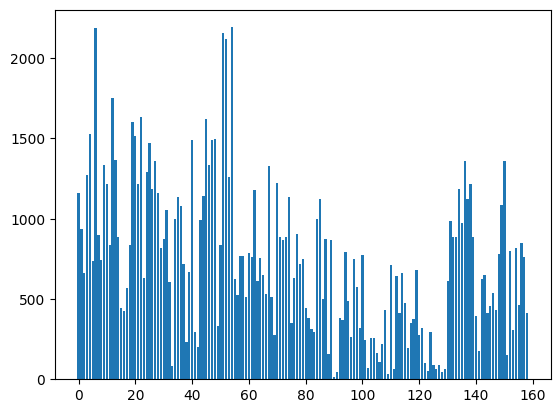

In [4]:
import matplotlib.pyplot as plt

temp_lengths = [len(temps) for temps in stations_maxtemp.values()]
plt.bar(range(len(temp_lengths)), temp_lengths)
plt.show()

过滤掉长度过短的样本

In [5]:
 max_temps = [temps for temps in stations_maxtemp.values() if len(temps) > 20]

In [42]:
len(max_temps)

158

观察样本温度异常值

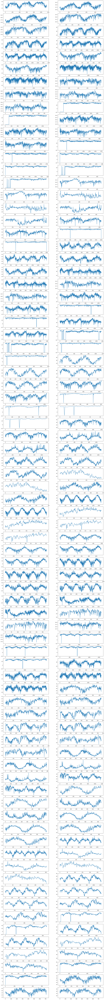

In [41]:
plt.figure(figsize=(20,200))

for i,temps in enumerate(range(79)):
    plt.subplot(79, 2, i*2+1)
    temps = max_temps[i]
    plt.plot(range(len(temps)),temps)
    plt.subplot(79, 2, i*2+2)
    temps = max_temps[i+1]
    plt.plot(range(len(temps)),temps)
plt.show()
    

In [58]:
# 过滤掉极寒异常值
filted_maxtemps = [[temp for temp in temps if temp > -17] for temps in max_temps]         

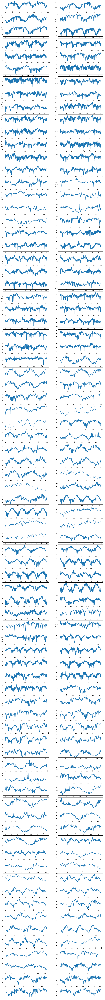

In [59]:
plt.figure(figsize=(20,200))

for i,temps in enumerate(range(79)):
    plt.subplot(79, 2, i*2+1)
    temps = filted_maxtemps[i]
    plt.plot(range(len(temps)),temps)
    plt.subplot(79, 2, i*2+2)
    temps = filted_maxtemps[i+1]
    plt.plot(range(len(temps)),temps)
plt.show()

生成数据集

In [ ]:
import numpy as np

def generate_time_series(temp_values, batch_size, n_steps):
    # 生成用于填充到数据集矩阵
    series = np.zeros((batch_size, n_steps))  # 5000,21
    # 生成随机样本索引
    sta_size = len(temp_values)
    sta_idx = np.random.randint(0, sta_size, batch_size)  # 5000

    
    for i, idx in enumerate(sta_idx):
        temps = temp_values[idx]  # 获取随机气象站的温度数据
        temp_size = len(temps)
        # 随机采样位置
        rnd_idx = np.random.randint(0, temp_size - n_steps)
    
        series[i] = np.array(temps[rnd_idx:rnd_idx+n_steps])  # series (5000, 21)
    # 返回X和y  X(5000, 20, 1) y (5000, 1)
    return series[:,:n_steps,np.newaxis].astype(np.float32), series[:,-1,np.newaxis].astype(np.float32)

In [71]:
n_steps = 21
max_temps = filted_maxtemps

X_train,y_train = generate_time_series(max_temps, 7000, n_steps)
X_valid,y_valid = generate_time_series(max_temps, 2000, n_steps)
X_test,y_test = generate_time_series(max_temps, 1000, n_steps)
X_train.shape, y_train.shape

((7000, 21, 1), (7000, 1))

In [72]:
import matplotlib.pyplot as plt 

def plot_series(series, y=None, y_pred=None, y_pred_std=None, x_label="$t$", y_label="$x$"):
    r, c = 3, 5
    fig, axes = plt.subplots(nrows=r, ncols=c, sharey=True, sharex=True, figsize=(20, 10))
    for row in range(r):
        for col in range(c):
            plt.sca(axes[row][col])
            ix = col + row*c
            plt.plot(series[ix, :], ".-")
            if y is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y[ix])), y[ix], "bx", markersize=10)
            if y_pred is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix], "ro")
            if y_pred_std is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix] + y_pred_std[ix])
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix] - y_pred_std[ix])
            plt.grid(True)
            # plt.hlines(0, 0, 100, linewidth=1)
            # plt.axis([0, len(series[ix, :])+len(y[ix]), -1, 1])
            if x_label and row == r - 1:
              plt.xlabel(x_label, fontsize=16)
            if y_label and col == 0:
              plt.ylabel(y_label, fontsize=16, rotation=0)
    plt.show()

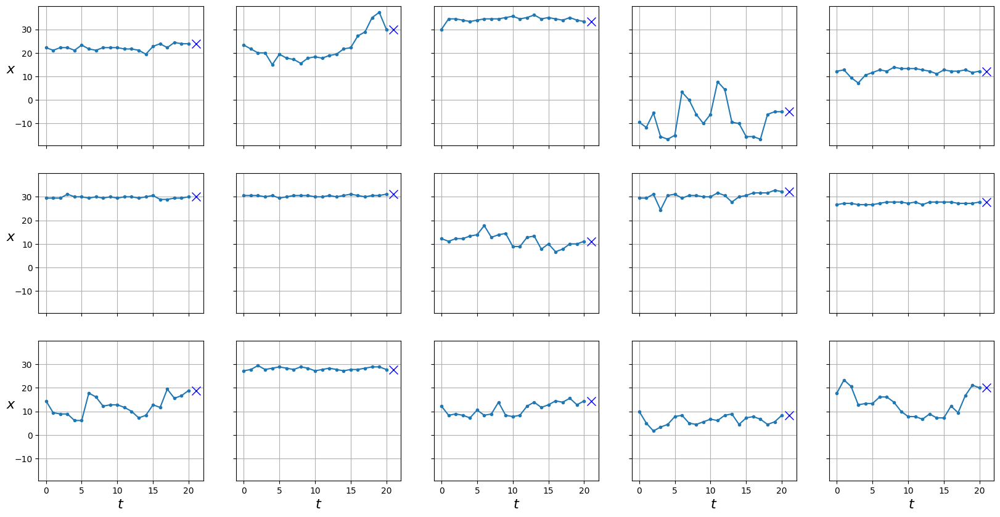

In [73]:
plot_series(X_test, y_test)

In [74]:
import torch
from torch.utils.data import Dataset, DataLoader

class TimeSeriesDataset(Dataset):
  def __init__(self, X, y=None, train=True):
    self.X = X
    self.y = y
    self.train = train

  def __len__(self):
    return len(self.X)

  def __getitem__(self, ix):
    if self.train:
      return torch.from_numpy(self.X[ix]), torch.from_numpy(self.y[ix])
    return torch.from_numpy(self.X[ix])

In [75]:
dataset = {
    'train': TimeSeriesDataset(X_train, y_train),
    'eval': TimeSeriesDataset(X_valid, y_valid),
    'test': TimeSeriesDataset(X_test, y_test, train=False)
}

dataloader = {
    'train': DataLoader(dataset['train'], shuffle=True, batch_size=64),
    'eval': DataLoader(dataset['eval'], shuffle=False, batch_size=64),
    'test': DataLoader(dataset['test'], shuffle=False, batch_size=64)
}

In [80]:
class RNN(torch.nn.Module):
  def __init__(self):
    super().__init__()
    self.rnn = torch.nn.RNN(input_size=1, hidden_size=64, num_layers=1, batch_first=True)
    self.fc = torch.nn.Linear(64, 1)

  def forward(self, x):
    x, h = self.rnn(x) 
    y = self.fc(x[:,-1])
    return y

rnn = RNN()

In [77]:
from tqdm import tqdm
device = "cuda" if torch.cuda.is_available() else "cpu"

def fit(model, dataloader, epochs=10):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = torch.nn.MSELoss()
    bar = tqdm(range(1, epochs+1))
    for epoch in bar:
        model.train()
        train_loss = []
        for batch in dataloader['train']:
            X, y = batch
            X, y = X.to(device), y.to(device)
            optimizer.zero_grad()
            y_hat = model(X)
            loss = criterion(y_hat, y)
            loss.backward()
            optimizer.step()
            train_loss.append(loss.item())
        model.eval()
        eval_loss = []
        with torch.no_grad():
            for batch in dataloader['eval']:
                X, y = batch
                X, y = X.to(device), y.to(device)
                y_hat = model(X)
                loss = criterion(y_hat, y)
                eval_loss.append(loss.item())
        bar.set_description(f"loss {np.mean(train_loss):.5f} val_loss {np.mean(eval_loss):.5f}")
        
def predict(model, dataloader):
    model.eval()
    with torch.no_grad():
        preds = torch.tensor([]).to(device)
        for batch in dataloader:
            X = batch
            X = X.to(device)
            pred = model(X)
            preds = torch.cat([preds, pred])
        return preds

In [81]:
fit(rnn, dataloader, epochs=50)

loss 0.03531 val_loss 0.06464: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]   


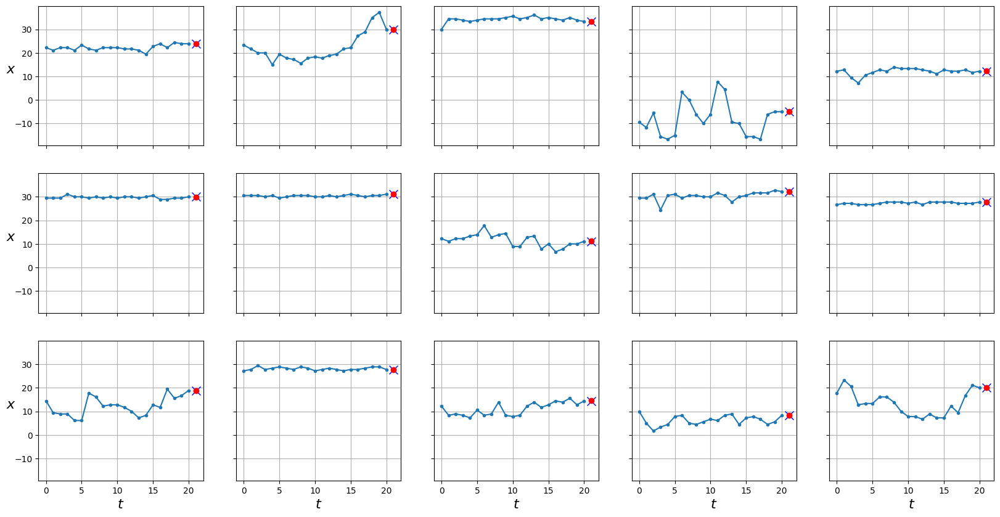

0.046977066

In [82]:
from sklearn.metrics import mean_squared_error

y_pred = predict(rnn, dataloader['test'])
plot_series(X_test, y_test, y_pred.cpu().numpy())  # cpu() 张量值从gpu搬运到计算机内存
mean_squared_error(y_test, y_pred.cpu())

RNN模型换成LSTM并添加隐藏层

In [88]:
class DeepRNN(torch.nn.Module):
  def __init__(self, n_in=50, n_out=1):
    super().__init__()
    self.rnn = torch.nn.LSTM(input_size=1, hidden_size=64, num_layers=2, batch_first=True)
    self.fc = torch.nn.Linear(64, 1)

  def forward(self, x):
    x, h = self.rnn(x) 
    x = self.fc(x[:,-1])
    return x

In [89]:
rnn = DeepRNN()
fit(rnn, dataloader, epochs=50)

loss 0.02907 val_loss 0.05772: 100%|██████████| 50/50 [01:26<00:00,  1.73s/it]   


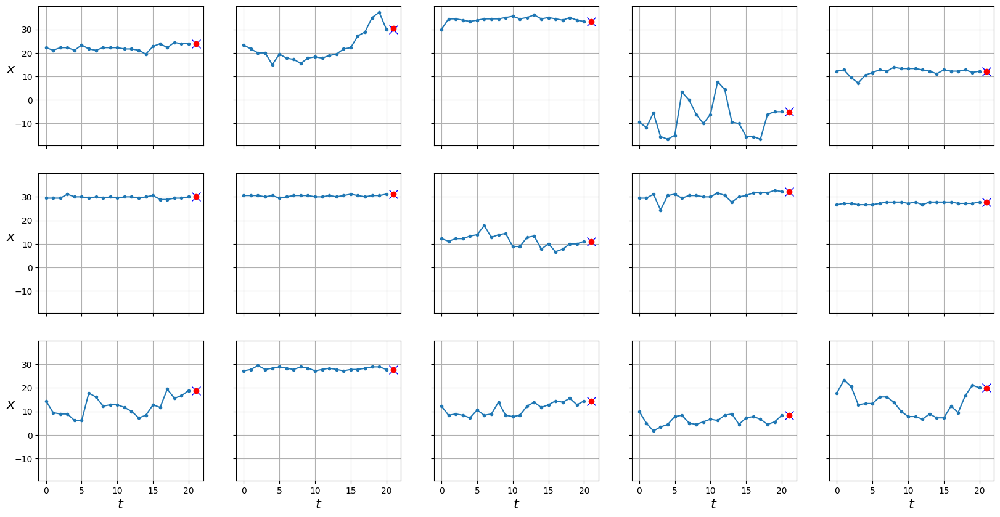

0.04642496

In [90]:
y_pred = predict(rnn, dataloader['test'])
plot_series(X_test, y_test, y_pred.cpu().numpy())
mean_squared_error(y_test, y_pred.cpu())

### 使用更多的特征来对温度进行预测

尝试加入经纬度位置值，来标记不同地区的温度变化特征

In [91]:
import pandas as pd

df_weather = pd.read_csv('/kaggle/input/weatherww2/Summary of Weather.csv')
df_station = pd.read_csv('/kaggle/input/weatherww2/Weather Station Locations.csv')

<ipython-input-91-19d34de96797>:3: DtypeWarning: Columns (7,8,18,25) have mixed types. Specify dtype option on import or set low_memory=False.
  df_weather = pd.read_csv('/kaggle/input/weatherww2/Summary of Weather.csv')


In [92]:
df_merged = pd.merge(df_weather, df_station, left_on='STA', right_on='WBAN', how='inner')

In [93]:
df_merged.columns

Index(['STA', 'Date', 'Precip', 'WindGustSpd', 'MaxTemp', 'MinTemp',
       'MeanTemp', 'Snowfall', 'PoorWeather', 'YR', 'MO', 'DA', 'PRCP', 'DR',
       'SPD', 'MAX', 'MIN', 'MEA', 'SNF', 'SND', 'FT', 'FB', 'FTI', 'ITH',
       'PGT', 'TSHDSBRSGF', 'SD3', 'RHX', 'RHN', 'RVG', 'WTE', 'WBAN', 'NAME',
       'STATE/COUNTRY ID', 'LAT', 'LON', 'ELEV', 'Latitude', 'Longitude'],
      dtype='object')

In [94]:
weather_info = df_merged[['STA','MaxTemp','Latitude','Longitude']]

In [95]:
weather_info.head()

,STA,MaxTemp,Latitude,Longitude
0,10001,25.555556,5.6,-0.3
1,10001,28.888889,5.6,-0.3
2,10001,26.111111,5.6,-0.3
3,10001,26.666667,5.6,-0.3
4,10001,26.666667,5.6,-0.3


In [96]:
def combin_fields(group):
    combin = zip(group['MaxTemp'].tolist(),group['Longitude'].tolist(),group['Latitude'].tolist())
    return [values for values in combin]

# 所有气象站最高气温和坐标数据
stations_maxtemp = weather_info.groupby('STA').apply(combin_fields).to_dict()

<ipython-input-96-3f5e7aab6c14>:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stations_maxtemp = weather_info.groupby('STA').apply(combin_fields).to_dict()


In [108]:
sta_temps = [tmps for tmps in stations_maxtemp.values() if len(tmps) > 20]

In [110]:
# 过滤掉极寒异常值
filted_statemps = [[temp for temp in temps if temp[0] > -17] for temps in sta_temps]         

In [ ]:
import numpy as np

# temp_values = sta_temps
# feature_size=3
# batch_size=4
# n_steps = 25
# label_size=5

def generate_time_series2(temp_values, batch_size, n_steps, feature_size=3, label_size=1):
    series = np.zeros((batch_size, n_steps, feature_size))  # [5000,21,3]
    sta_size = len(temp_values)
    sta_idx = np.random.randint(0, sta_size, batch_size)  # 5000 index
    
    for i,idx in enumerate(sta_idx):
        temps = temp_values[idx]  # [(23.0, 113.0, -23.0), (22.0, 113.0, -23.0), ...]
        temp_size = len(temps)
        rnd_idx = np.random.randint(0, temp_size - n_steps)
        # 生成随机采样位置 [21,3]
        series[i] = np.array(temps[rnd_idx:rnd_idx+n_steps]).reshape(n_steps,-1)
    # 返回X和y  X(5000, 20, 3) y (5000, 1)
    return series[:,:n_steps-label_size].astype(np.float32), series[:,-label_size:,0].astype(np.float32)


In [129]:
n_steps = 21
max_temps = filted_statemps

X_train,y_train = generate_time_series2(max_temps, 7000, n_steps)
X_valid,y_valid = generate_time_series2(max_temps, 2000, n_steps)
X_test,y_test = generate_time_series2(max_temps, 1000, n_steps)
X_train.shape, y_train.shape

((7000, 20, 3), (7000, 1))

In [112]:

def plot_series2(series, y=None, y_pred=None, y_pred_std=None, x_label="$t$", y_label="$x$"):
    r, c = 3, 5
    fig, axes = plt.subplots(nrows=r, ncols=c, sharey=True, sharex=True, figsize=(20, 10))
    for row in range(r):
        for col in range(c):
            plt.sca(axes[row][col])
            ix = col + row*c
            plt.plot(series[ix, :, 0], ".-")  # 只获取第0个位置的MaxTemp值
            if y is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y[ix])), y[ix], "bx", markersize=10)
            if y_pred is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix], "ro")
            if y_pred_std is not None:
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix] + y_pred_std[ix])
                plt.plot(range(len(series[ix, :]), len(series[ix, :])+len(y_pred[ix])), y_pred[ix] - y_pred_std[ix])
            plt.grid(True)
            # plt.hlines(0, 0, 100, linewidth=1)
            # plt.axis([0, len(series[ix, :])+len(y[ix]), -1, 1])
            if x_label and row == r - 1:
              plt.xlabel(x_label, fontsize=16)
            if y_label and col == 0:
              plt.ylabel(y_label, fontsize=16, rotation=0)
    plt.show()

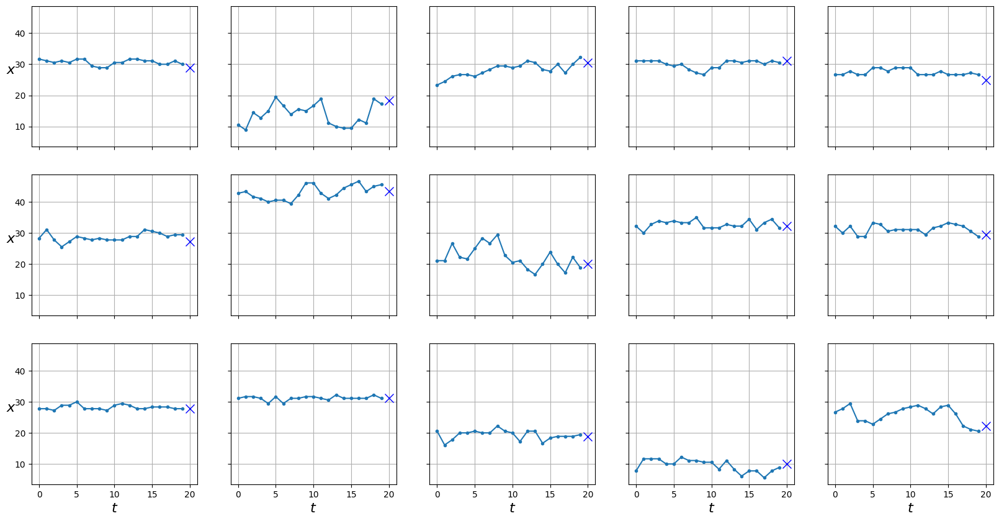

In [113]:
plot_series2(X_test, y_test)

In [130]:
dataset = {
    'train': TimeSeriesDataset(X_train, y_train),
    'eval': TimeSeriesDataset(X_valid, y_valid),
    'test': TimeSeriesDataset(X_test, y_test, train=False)
}

dataloader = {
    'train': DataLoader(dataset['train'], shuffle=True, batch_size=64),
    'eval': DataLoader(dataset['eval'], shuffle=False, batch_size=64),
    'test': DataLoader(dataset['test'], shuffle=False, batch_size=64)
}

In [131]:
class DeepRNN2(torch.nn.Module):
  def __init__(self):
    super().__init__()
    self.rnn = torch.nn.LSTM(input_size=3, hidden_size=64, num_layers=2, batch_first=True)
    self.fc = torch.nn.Linear(64, 1)

  def forward(self, x):
    x, h = self.rnn(x) 
    x = self.fc(x[:,-1])
    return x

rnn2 = DeepRNN2()

In [132]:
fit(rnn2, dataloader, epochs=50)

loss 4.18812 val_loss 3.84255: 100%|██████████| 50/50 [01:23<00:00,  1.68s/it]   


实验效果不理想,loss值过大。放弃更多的特征值导入。

### 使用RNN预测多个值

In [163]:
n_steps = 25
feature_size=1
label_size=5
max_temps = filted_maxtemps

X_train,y_train = generate_time_series2(max_temps, 7000, n_steps,feature_size, label_size)
X_valid,y_valid = generate_time_series2(max_temps, 2000, n_steps,feature_size, label_size)
X_test,y_test = generate_time_series2(max_temps, 1000, n_steps,feature_size, label_size)
X_train.shape, y_train.shape

((7000, 20, 1), (7000, 5))

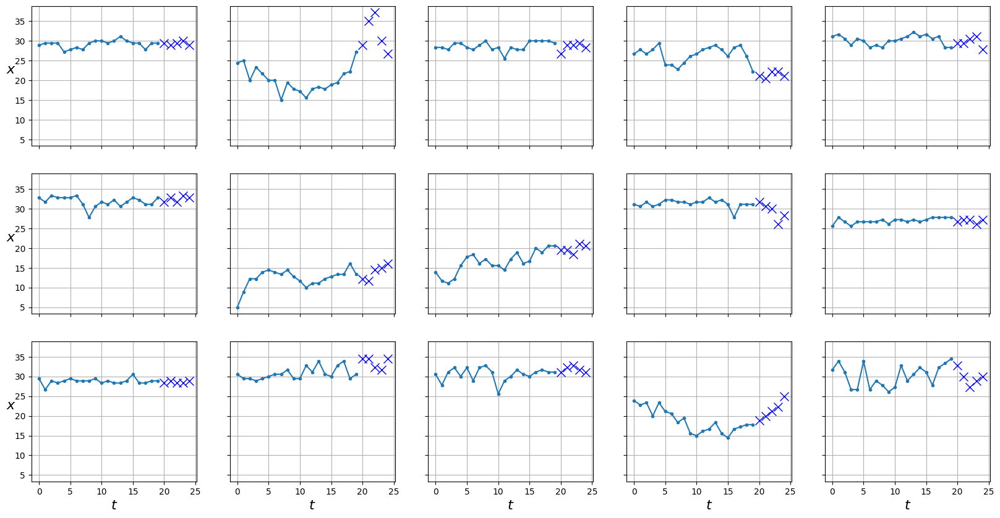

In [148]:
plot_series(X_test, y_test)

In [164]:
dataset = {
    'train': TimeSeriesDataset(X_train, y_train),
    'eval': TimeSeriesDataset(X_valid, y_valid),
    'test': TimeSeriesDataset(X_test, y_test, train=False)
}

dataloader = {
    'train': DataLoader(dataset['train'], shuffle=True, batch_size=64),
    'eval': DataLoader(dataset['eval'], shuffle=False, batch_size=64),
    'test': DataLoader(dataset['test'], shuffle=False, batch_size=64)
}

In [142]:
class DeepRNN(torch.nn.Module):
  def __init__(self, n_out=5):
    super().__init__()
    self.rnn = torch.nn.LSTM(input_size=1, hidden_size=128, num_layers=1, batch_first=True)
    self.fc = torch.nn.Linear(128, n_out)

  def forward(self, x):
    x, h = self.rnn(x) 
    x = self.fc(x[:,-1])
    return x

In [145]:
rnn3 = DeepRNN()

In [146]:
fit(rnn3, dataloader, epochs=50)

loss 5.95060 val_loss 6.07348: 100%|██████████| 50/50 [01:24<00:00,  1.69s/it]   


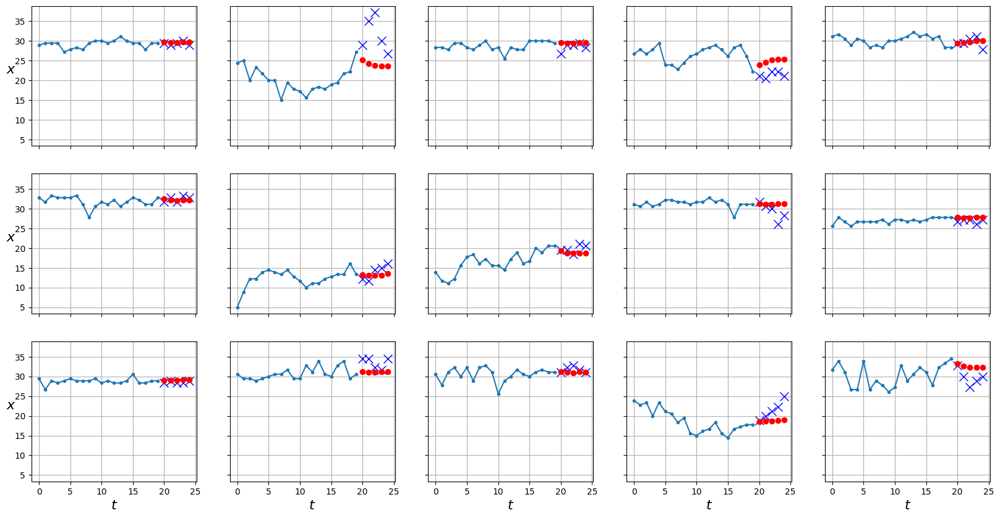

6.817773

In [151]:
y_pred = predict(rnn3, dataloader['test'])
plot_series(X_test, y_test, y_pred.cpu().numpy())
mean_squared_error(y_test, y_pred.cpu())

单纯增加RNN隐藏层数量并不能解决同时预测多个值的问题。

In [193]:
class DeepRNN(torch.nn.Module):
  def __init__(self,n_out=5):
    super().__init__()
    self.rnn = torch.nn.LSTM(input_size=1, hidden_size=64, num_layers=2, batch_first=True)
    self.pool = torch.nn.AvgPool1d(20)
    self.fc = torch.nn.Linear(64, n_out)

  def forward(self, x):
    x, h = self.rnn(x)
    x = x.permute(0,2,1)
    x = self.pool(x)
    x = x.squeeze(-1)
    y = self.fc(x)
    return y

rnn4 = DeepRNN()

In [192]:
inp = torch.randn(64,20,1)
r = rnn4(inp)
r.shape

torch.Size([64, 5])

In [194]:
fit(rnn4, dataloader, epochs=50)

loss 6.02281 val_loss 6.72600: 100%|██████████| 50/50 [01:24<00:00,  1.70s/it]   


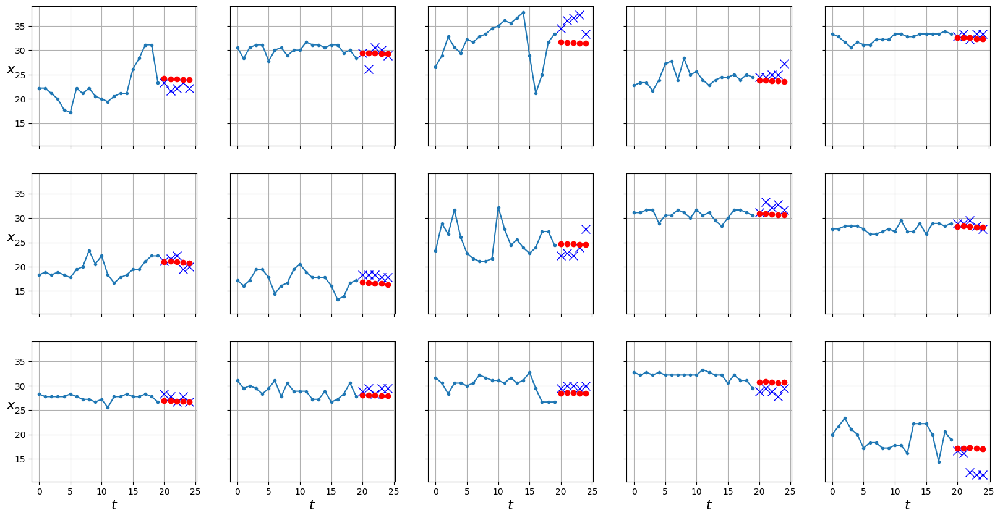

6.693846

In [195]:
y_pred = predict(rnn4, dataloader['test'])
plot_series(X_test, y_test, y_pred.cpu().numpy())
mean_squared_error(y_test, y_pred.cpu())

对于使用AvgPool1d汇总多个值（全局所有times特征输出）再交Linear层推理的实验。效果也不理想。在预测更长连续温度值时RNN模型存在较大偏差。